In [22]:
using Plots
using Dates
using Statistics
using MarketData
using DataFrames
using Distributions

In [4]:
ticker = "AAPL"
start_date = DateTime(2020, 1, 1)
end_date = Dates.now()

data = yahoo(ticker, YahooOpt(period1 = start_date, period2 = end_date))
df = DataFrame(data)
first(df, 5)

,timestamp,Open,High,Low,Close,AdjClose,Volume
,Date,Float64,Float64,Float64,Float64,Float64,Float64
1,2020-01-02,74.06,75.15,73.7975,75.0875,73.84,1.3548e8
2,2020-01-03,74.2875,75.145,74.125,74.3575,73.1222,1.46323e8
3,2020-01-06,73.4475,74.99,73.1875,74.95,73.7048,1.18387e8
4,2020-01-07,74.96,75.225,74.37,74.5975,73.3582,1.08872e8
5,2020-01-08,74.29,76.11,74.29,75.7975,74.5382,1.32079e8


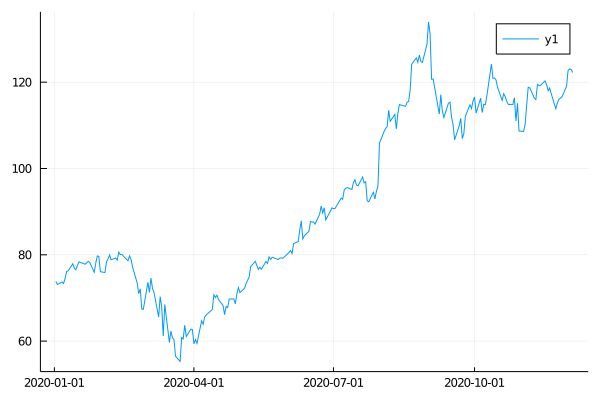

In [10]:
plot(df.timestamp, df.AdjClose)

In [5]:
prices = df[:, [:timestamp, :AdjClose]]
first(prices, 5)

,timestamp,AdjClose
,Date,Float64
1,2020-01-02,73.84
2,2020-01-03,73.1222
3,2020-01-06,73.7048
4,2020-01-07,73.3582
5,2020-01-08,74.5382


In [6]:
function pct_change(input::AbstractVector{<:Number})
    [i == 1 ? missing : (input[i]-input[i-1])/input[i-1] for i in eachindex(input)]
end

pct_change (generic function with 1 method)

In [8]:
prices.Return = pct_change(prices.AdjClose)
first(prices, 5)

,timestamp,AdjClose,Return
,Date,Float64,Float64?
1,2020-01-02,73.84,missing
2,2020-01-03,73.1222,-0.0097222
3,2020-01-06,73.7048,0.00796838
4,2020-01-07,73.3582,-0.004703
5,2020-01-08,74.5382,0.0160862


In [18]:
vol = std(prices.Return[2:end, :]) * sqrt(252)
vol

0.4784659353852628

In [26]:
growth = prices.AdjClose[end] / prices.AdjClose[1]
days = Dates.value(prices.timestamp[end] - prices.timestamp[1])
timeframe = days / 365
annual_growth = (growth ^ (1/timeframe)) - 1

0.7264308986702175

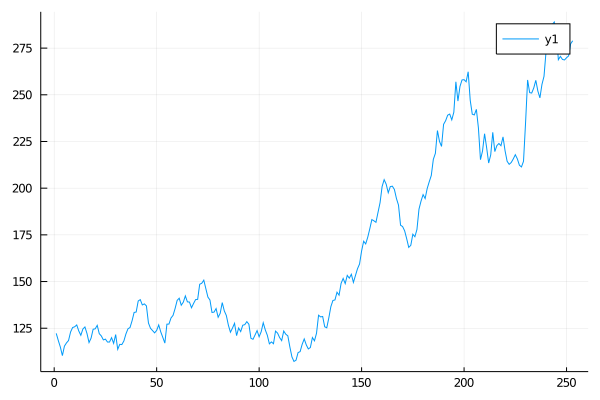

In [28]:
mu = annual_growth / 252
rand_returns = rand(Normal(mu, vol / sqrt(252)), 252) .+ 1
res = [prices.AdjClose[end]]

for r in rand_returns
    push!(res, res[end] * r)
end

plot(1:length(res), res)

In [46]:
trials = 3000
mu = annual_growth / 252
last_close = prices.AdjClose[end]

end_prices = []
for i=1:trials
    rand_returns = rand(Normal(mu, vol / sqrt(252)), 252) .+ 1
    res = [last_close]

    for r in rand_returns
        push!(res, res[end] * r)
    end
    
    push!(end_prices, res[end])
    if i == 1
        global plt = plot(1:length(res), res, legend = false, linecolor = "grey", linealpha = 0.05)
    else
        plot!(plt, 1:length(res), res, linecolor = "grey", linealpha = 0.05)
    end
end

In [47]:
display(plt)

In [49]:
sum(end_prices .> last_close) / trials

0.9003333333333333